**Introduction**
Content-Based Image Retrieval (CBIR) is a widley used technique in the computer vision field in which it uses the visual content so it retrieves images form databases.
unlike the traditional techniques the CBIR does not use on textual descriptions or metadata however it performs retrieval by using the intrinsic characteristics of images. Digital asset management, medical imaging, and image search engines are just a few of the fields in which this technology is used.


**Theoretical Background of Color Histograms and Color Moments:**
Content-Based Image Retrieval (CBIR) relies heavily on color histograms and color moments, which provide a quantitative description of an image's color distribution and statistical features. Color histograms efficiently record an image's global color information by dividing the color space into discrete bins. They count the amount of pixels in each bin to illustrate the distribution of colors. Color moments are statistical measurements that describe the distribution of colors or pixel intensities in an image. These measures include mean, standard deviation, skewness, median, mode, and kurtosis. When these features are combined, CBIR systems can accurately and efficiently describe the color characteristics of an image, which is useful for image retrieval based on visual content similarity in a variety of applications.

**System Implementation**
 In order to effectively retrieve the images based on similarity in content, an implementation of CBIR uses a configurable architecture. Extraction of image features, distance calculation, and visualization of results are the main modules.

 **Image Feature Extraction**:
 Image Feature Extraction: Using color histograms with different bin sizes 120, 180, 256, the system extracts features from the images. In the RGB color space, the features capture the distribution of the pixel intensities. get_features uses OpenCV to calculate normalized histograms for each color channel Red, Green, Blue by concatenating them into a vector of features.
 **Distance Calculation:**
 The Euclidean distance between the feature vectors of a query image and all images in the dataset is computed by the calculate_distance function. A distance matrix, called distances, is used to store the pairwise distances between each query and image in the dataset.


**ROC Curve and AUC Calculation:**
The performance of the system is assessed by employing Receiver Operating Characteristic (ROC) curves and Area Under the Curve (AUC) metrics.
By varying distance thresholds, the system calculates the True Positive Rate (TPR) and False Positive Rate (FPR) to construct the ROC curve.

**Visualization of Results:**
To visually represent the system's performance, the visualize_top_images function displays the top-retrieved images for a given threshold.
This visualization includes the query image along with a collection of retrieved images, each accompanied by its respective distance.

**Implementation Details:**
The Python programming language is used to implement the system, making use of various libraries including OpenCV for image processing, NumPy for numerical operations, Matplotlib for visualization, and Scikit-learn for AUC calculation.
To extract image datasets, the unzip_folder function is utilized to unpack the provided zip files.
The CBIR system assesses the impact of multiple bin sizes for color histograms on retrieval performance.
To enhance code efficiency and readability, programming paradigms such as modularization and vectorized operations are employed.
The overall structure of the system is designed with flexibility in mind, allowing for easy adaptation to future improvements or changes in feature extraction techniques or distance metrics.


**Task 1 and 2:**

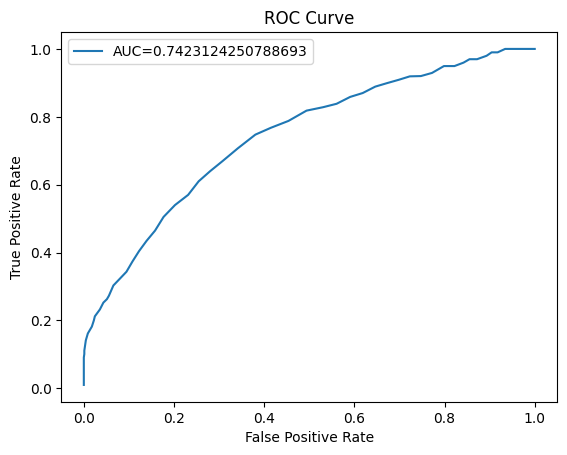

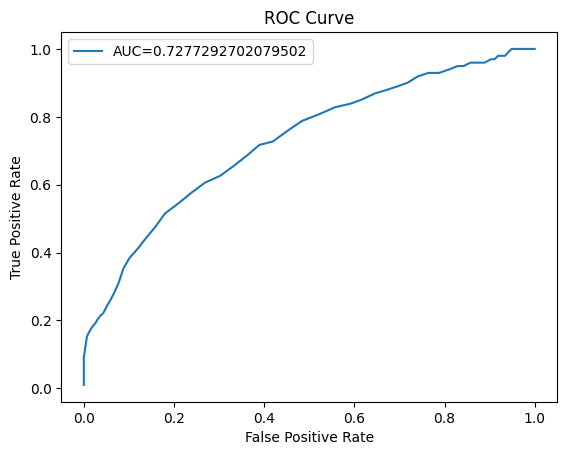

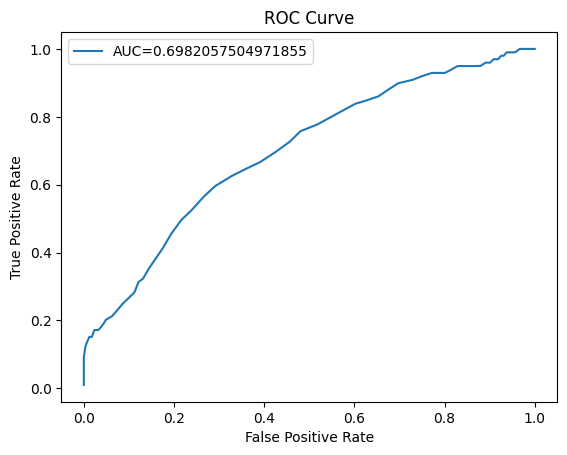

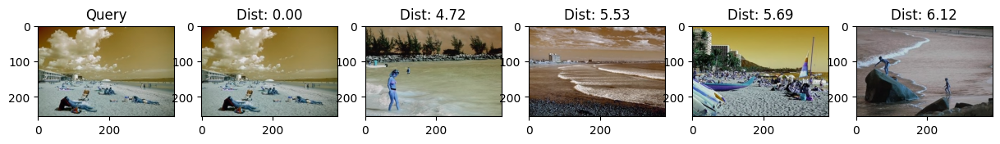

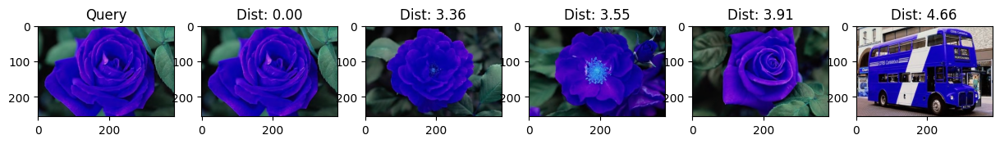

...

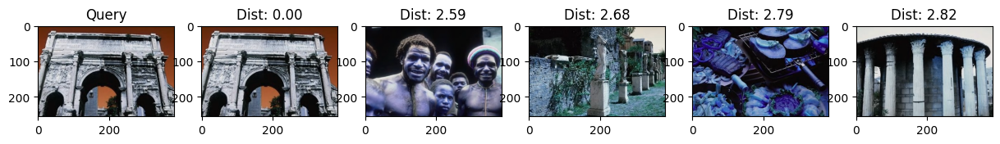

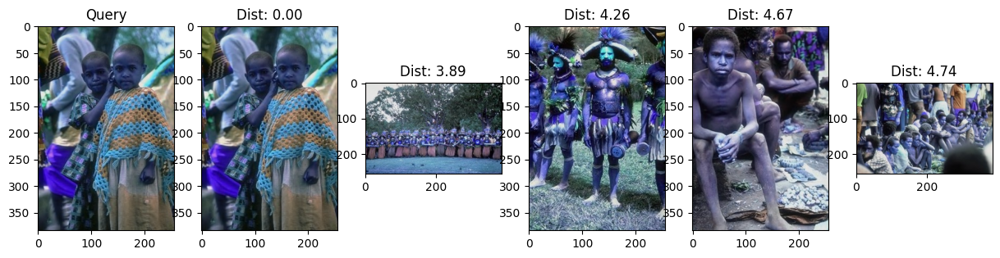

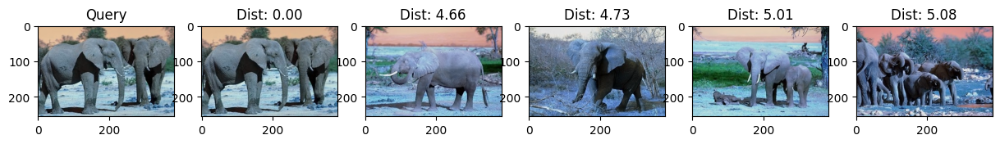

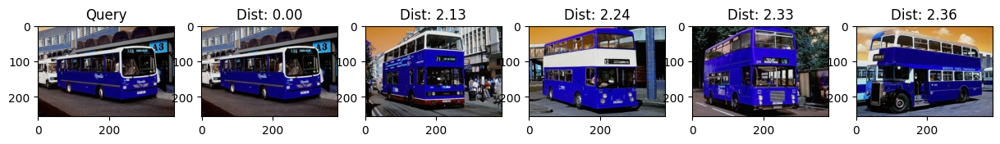

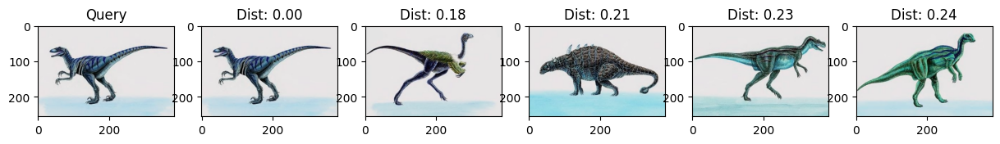

In [ ]:
import zipfile
import os
import cv2
import numpy as np
from sklearn.metrics import auc
import matplotlib.pyplot as plt
def calculate_distance(image,query):
  return np.linalg.norm(image-query)

def unzip_folder(zip_file, extract_folder):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_folder)

def get_features(image_path, bins):
    image = cv2.imread(image_path)
    B = cv2.calcHist([image], [0], None, [bins], [0, 256])
    G = cv2.calcHist([image], [1], None, [bins], [0, 256])
    R = cv2.calcHist([image], [2], None, [bins], [0, 256])

    cv2.normalize(B, B, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(G, G, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(R, R, 0, 1, cv2.NORM_MINMAX)

    return np.concatenate((R, G, B), axis=None)

unzip_folder('Dataset.zip', '')
unzip_folder('Queries.zip', '')

def visualize_top_images(images_folder, queries_folder, distances, threshold, num_top_images=5):
    for query in os.listdir(queries_folder):
        quer = int(query.split('.')[0])
        distances_to_query = distances[quer]

        # Sort images based on distances
        sorted_images = sorted(enumerate(distances_to_query), key=lambda x: x[1])

        # Filter images below the threshold
        relevant_images = [img_idx for img_idx, dist in sorted_images if dist <= threshold]

        # Plot top images
        plt.figure(figsize=(15, 5))
        plt.subplot(1, num_top_images + 1, 1)
        plt.imshow(cv2.imread(os.path.join(queries_folder, query)))
        plt.title("Query")

        for i in range(num_top_images):
            img_idx = relevant_images[i]
            image_path = os.path.join(images_folder, f"{img_idx}.jpg")
            plt.subplot(1, num_top_images + 1, i + 2)
            plt.imshow(cv2.imread(image_path))
            plt.title(f"Dist: {distances_to_query[img_idx]:.2f}")

        plt.show()

bins=[120,180,256]
for bin in bins:

  images = [None] * 1000

  for image in os.listdir('Images'):
      images[int(image.split('.')[0])] = get_features('Images/' + image, bin)
  distances=[]
  for i in range(1000):
    dis=[]
    for j in range(1000):
      dis.append(1.0)
    distances.append(dis)

  mx=0
  for query in os.listdir('Queries'):
    for image in os.listdir('Images'):
      quer=int(query.split('.')[0])
      img=int(image.split('.')[0])
      distances[quer][img]=calculate_distance(images[quer],images[int(image.split('.')[0])])
      mx=max(mx,distances[quer][img])

  true_pos=[]
  false_pos=[]
  for threshold in np.arange(0,mx,mx/100):
    tp=0
    fp=0
    tn=0
    fn=0
    for query in os.listdir('Queries'):
      for image in os.listdir('Images'):
        quer=int(query.split('.')[0])
        img=int(image.split('.')[0])
        left_range_query=quer//100*100
        right_range_query=left_range_query+99
        if distances[quer][img]<=threshold and left_range_query<=img<=right_range_query:
          tp+=1
        elif distances[quer][img]<=threshold and (img>right_range_query or img<left_range_query):
          fp+=1
        elif distances[quer][img]>threshold and left_range_query<=img<=right_range_query:
          fn+=1
        else:
          tn+=1
    tp=tp//10
    fp=fp//10
    tn=tn//10
    fn=fn//10
    precise=tp/(tp+fp)
    recall=tp/(tp+fn)
    f1_score=(2*precise*recall)/(precise+recall)
    fpr=fp/(fp+tn)
    tpr=tp/(tp+fn)
    true_pos.append(tpr)
    false_pos.append(fpr)
    #plot some results
  AUC=auc(false_pos,true_pos)
  plt.plot(false_pos,true_pos,label = f'AUC={AUC}')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'ROC Curve')
  plt.legend()
  plt.show()

visualize_top_images('Images', 'Queries', distances, mx)




**Task 3.1**

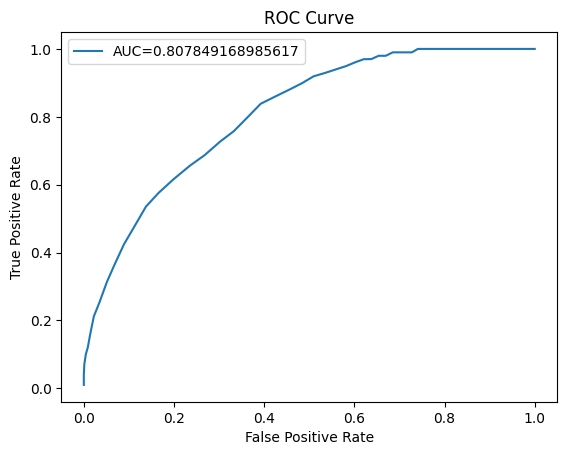

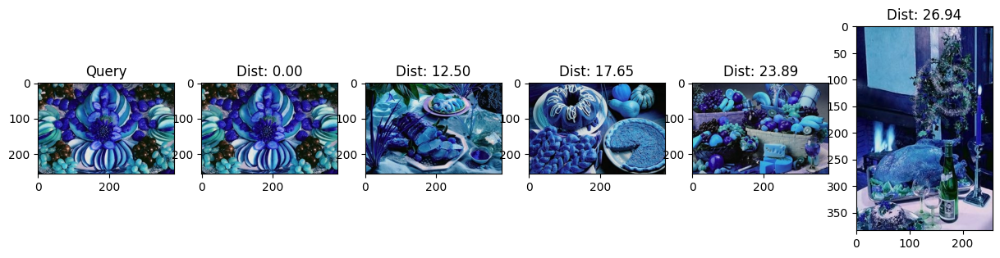

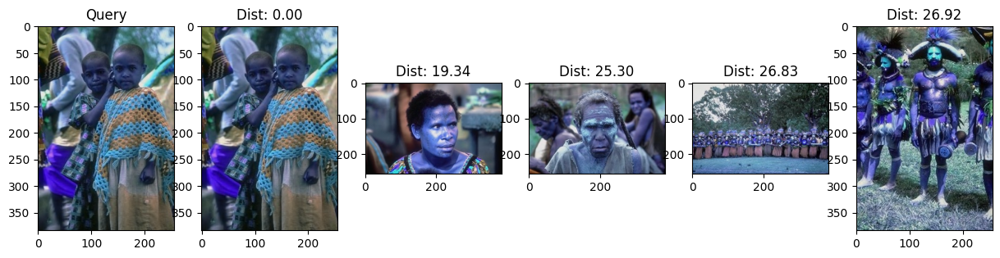

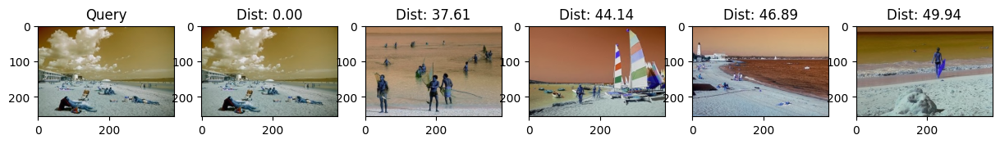

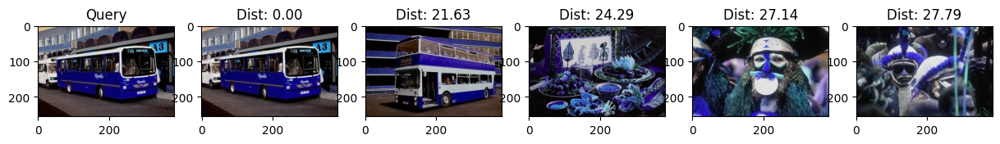

...

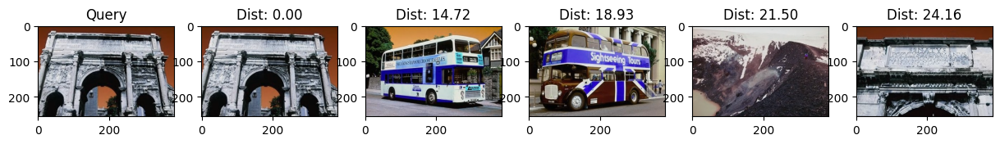

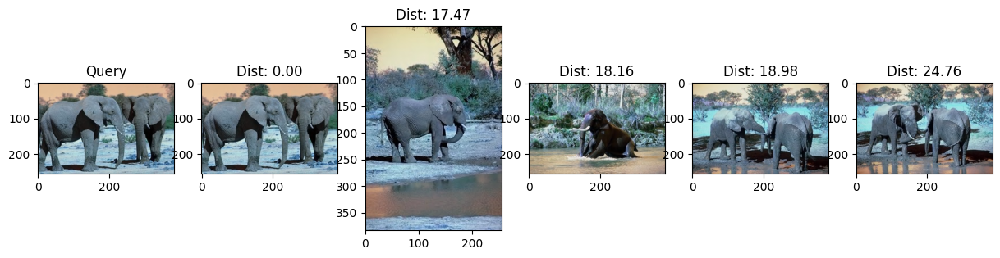

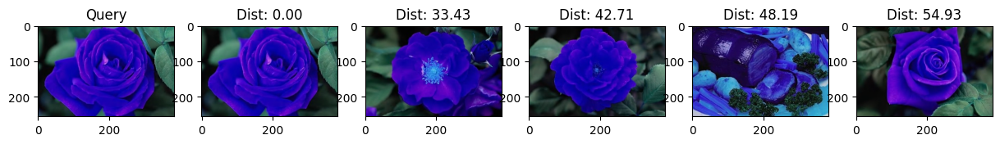

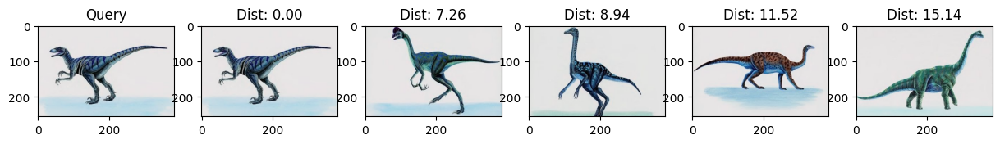

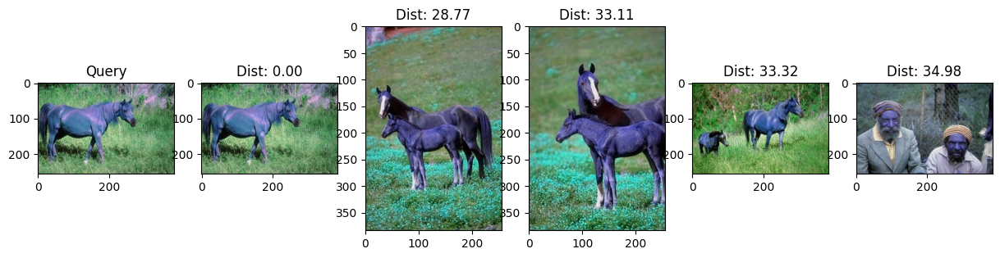

In [ ]:
import zipfile
import os
import cv2
import numpy as np
from sklearn.metrics import auc
import matplotlib.pyplot as plt
from scipy.stats import skew

def calculate_distance_moments(image,query):
  distance=0
  for i in range(3):
    distance+=abs(image[i][0]-query[i][0])+abs(image[i][1]-query[i][1])+abs(image[i][2]-query[i][2])
  return distance


def get_moments(image_path):
    image=cv2.imread(image_path)
    B,G,R=cv2.split(image)
    return np.array([
      [np.mean(R),np.std(R),skew(R.flatten())],
      [np.mean(G),np.std(G),skew(G.flatten())],
      [np.mean(B),np.std(B),skew(B.flatten())],
    ])




images = [None] * 1000

for image in os.listdir('Images'):
    images[int(image.split('.')[0])] = get_moments('Images/' + image)
distances=[]
for i in range(1000):
  dis=[]
  for j in range(1000):
    dis.append(1.0)
  distances.append(dis)

mx=0
for query in os.listdir('Queries'):
  for image in os.listdir('Images'):
    quer=int(query.split('.')[0])
    img=int(image.split('.')[0])
    distances[quer][img]=calculate_distance_moments(images[quer],images[int(image.split('.')[0])])
    mx=max(mx,distances[quer][img])

true_pos=[]
false_pos=[]
for threshold in np.arange(0,mx,mx/100):
  tp=0
  fp=0
  tn=0
  fn=0
  for query in os.listdir('Queries'):
    for image in os.listdir('Images'):
      quer=int(query.split('.')[0])
      img=int(image.split('.')[0])
      left_range_query=quer//100*100
      right_range_query=left_range_query+99
      if distances[quer][img]<=threshold and left_range_query<=img<=right_range_query:
        tp+=1
      elif distances[quer][img]<=threshold and (img>right_range_query or img<left_range_query):
        fp+=1
      elif distances[quer][img]>threshold and left_range_query<=img<=right_range_query:
        fn+=1
      else:
        tn+=1
  tp=tp//10
  fp=fp//10
  tn=tn//10
  fn=fn//10
  precise=tp/(tp+fp)
  recall=tp/(tp+fn)
  f1_score=(2*precise*recall)/(precise+recall)
  fpr=fp/(fp+tn)
  tpr=tp/(tp+fn)
  true_pos.append(tpr)
  false_pos.append(fpr)
  #plot some results
AUC=auc(false_pos,true_pos)
plt.plot(false_pos,true_pos,label = f'AUC={AUC}')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve')
plt.legend()
plt.show()
visualize_top_images('Images', 'Queries', distances, mx)





The color moments-based image retrieval system demonstrated a promising AUC-ROC score of 0.8078, signifying a moderate level of accuracy. This implies that relying solely on color moments can be a feasible method for accomplishing image retrieval tasks.

**Task 3.2**

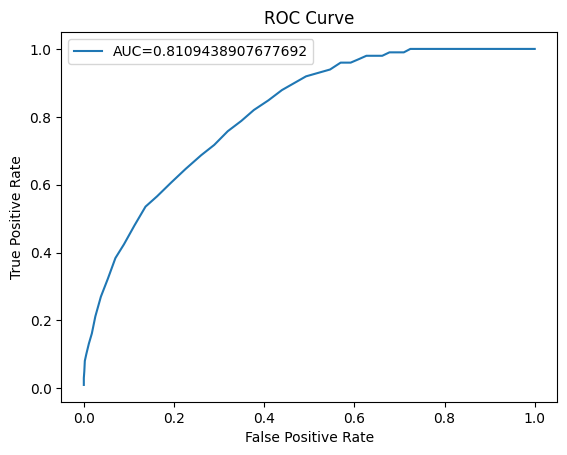

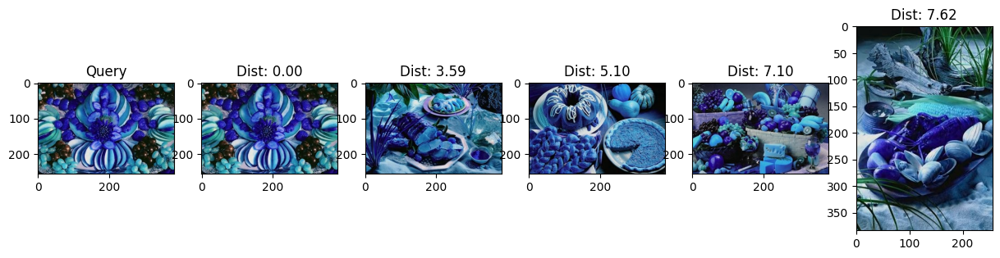

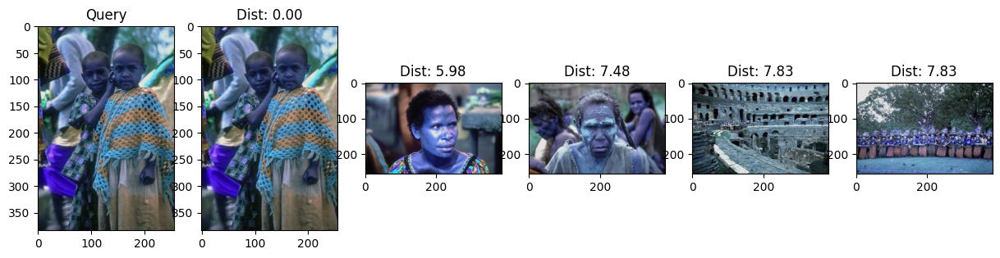

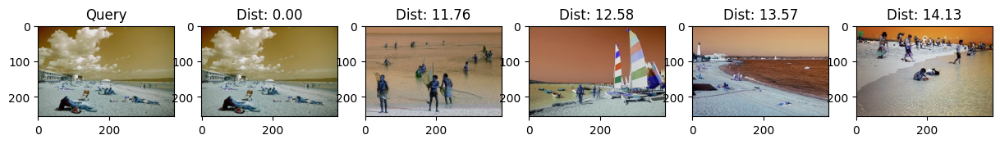

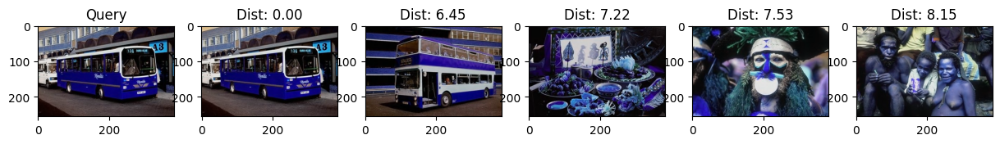

...

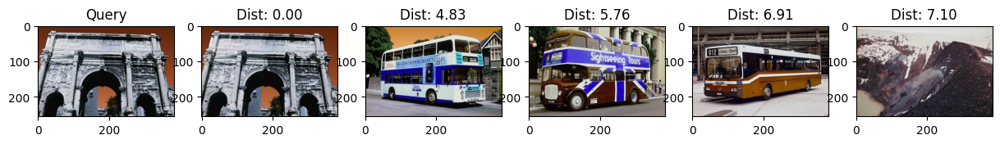

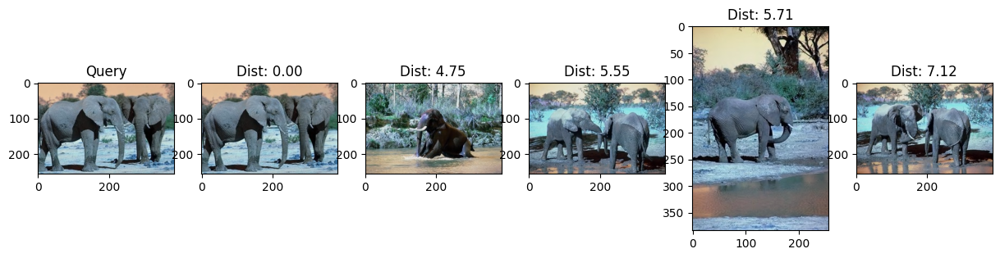

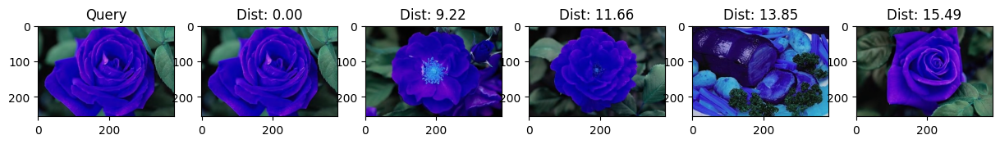

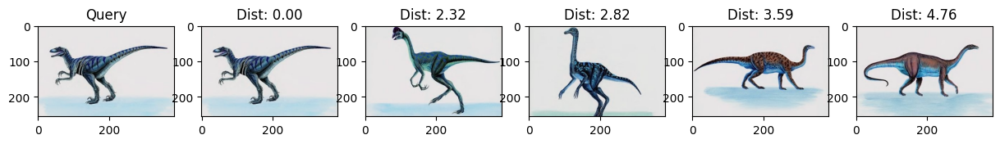

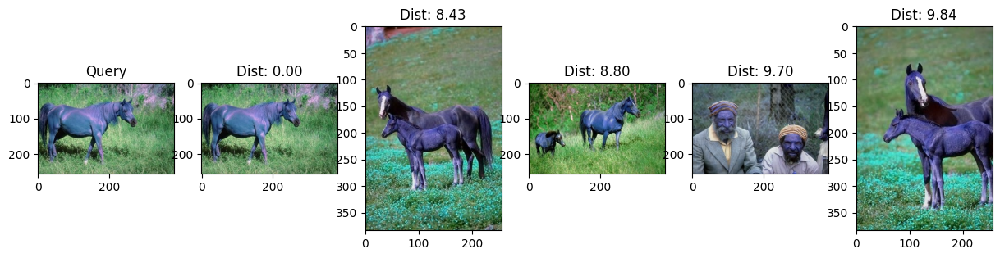

In [ ]:
import zipfile
import os
import cv2
import numpy as np
from sklearn.metrics import auc
import matplotlib.pyplot as plt
from scipy.stats import skew
def calculate_distance_moments2(image,query,weights):
  distance=0
  for i in range(3):
    distance+=(abs(image[i][0]-query[i][0])*weights[0])+(abs(image[i][1]-query[i][1])*weights[1])+(abs(image[i][2]-query[i][2])*weights[2])
  return distance


def get_moments2(image_path):
    image=cv2.imread(image_path)
    B,G,R=cv2.split(image)
    return np.array([
      [np.mean(R),np.std(R),skew(R.flatten())],
      [np.mean(G),np.std(G),skew(G.flatten())],
      [np.mean(B),np.std(B),skew(B.flatten())],
    ])




images = [None] * 1000

for image in os.listdir('Images'):
    images[int(image.split('.')[0])] = get_moments2('Images/' + image)
distances=[]
for i in range(1000):
  dis=[]
  for j in range(1000):
    dis.append(1.0)
  distances.append(dis)

mx=0
for query in os.listdir('Queries'):
  for image in os.listdir('Images'):
    quer=int(query.split('.')[0])
    img=int(image.split('.')[0])
    weights=[0.25,0.35,0.4]

    distances[quer][img]=calculate_distance_moments2(images[quer],images[int(image.split('.')[0])],weights)
    mx=max(mx,distances[quer][img])

true_pos=[]
false_pos=[]
for threshold in np.arange(0,mx,mx/100):
  tp=0
  fp=0
  tn=0
  fn=0
  for query in os.listdir('Queries'):
    for image in os.listdir('Images'):
      quer=int(query.split('.')[0])
      img=int(image.split('.')[0])
      left_range_query=quer//100*100
      right_range_query=left_range_query+99
      if distances[quer][img]<=threshold and left_range_query<=img<=right_range_query:
        tp+=1
      elif distances[quer][img]<=threshold and (img>right_range_query or img<left_range_query):
        fp+=1
      elif distances[quer][img]>threshold and left_range_query<=img<=right_range_query:
        fn+=1
      else:
        tn+=1
  tp=tp//10
  fp=fp//10
  tn=tn//10
  fn=fn//10
  precise=tp/(tp+fp)
  recall=tp/(tp+fn)
  f1_score=(2*precise*recall)/(precise+recall)
  fpr=fp/(fp+tn)
  tpr=tp/(tp+fn)
  true_pos.append(tpr)
  false_pos.append(fpr)
  #plot some results
  #choose one threshold , plot 10 queries and for each query plot least 5 distances, plot the images not the distances
AUC=auc(false_pos,true_pos)
plt.plot(false_pos,true_pos,label = f'AUC={AUC}')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve')
plt.legend()
plt.show()
visualize_top_images('Images', 'Queries', distances, mx)





The retrieval accuracy has been enhanced through the implementation of the weighted distance approach, with a focus on prioritizing the green and blue channels in which the roc here is higher than above. It is of utmost importance to thoroughly analyze precision, recall, and the retrieved images in order to validate the overall effectiveness of the model.

**Task 3.3**

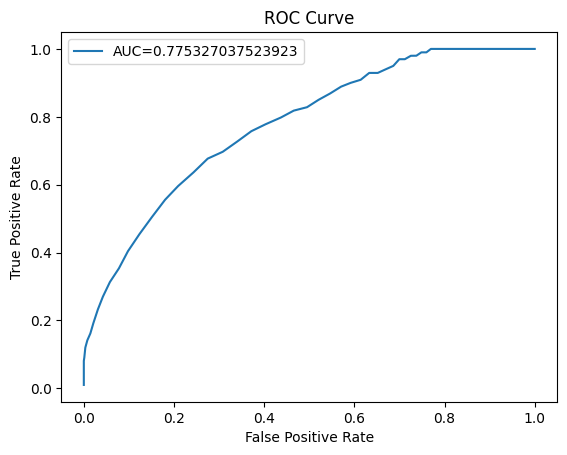

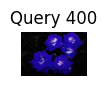

In [ ]:
import zipfile
import os
import cv2
import numpy as np
from sklearn.metrics import auc
import matplotlib.pyplot as plt
from scipy.stats import skew , mode,kurtosis

def calculate_distance_moments3(image,query,weights):
  distance=0
  for i in range(3):
    distance+=(abs(image[i][0]-query[i][0])*weights[0])+(abs(image[i][1]-query[i][1])*weights[1])+(abs(image[i][2]-query[i][2])*weights[2])
    distance+=(abs(image[i][3]-query[i][3])*weights[3])+(abs(image[i][4]-query[i][4])*weights[4])+(abs(image[i][5]-query[i][5])*weights[5])

  return distance


def get_moments3(image_path):
    image=cv2.imread(image_path)
    B,G,R=cv2.split(image)
    return np.array([
      [np.mean(R),np.std(R),skew(R.flatten()), np.median(R), mode(R).mode[0], kurtosis(R.flatten())],
      [np.mean(G),np.std(G),skew(G.flatten()), np.median(G), mode(G).mode[0], kurtosis(G.flatten())],
      [np.mean(B),np.std(B),skew(B.flatten()), np.median(B), mode(B).mode[0], kurtosis(B.flatten())],
    ])




images = [None] * 1000

for image in os.listdir('Images'):
    images[int(image.split('.')[0])] = get_moments3('Images/' + image)
distances=[]
for i in range(1000):
  dis=[]
  for j in range(1000):
    dis.append(1.0)
  distances.append(dis)

mx=0
for query in os.listdir('Queries'):
  for image in os.listdir('Images'):
    quer=int(query.split('.')[0])
    img=int(image.split('.')[0])
    weights=[0.15,0.20,0.35,0.10,0.13,0.17]

    distances[quer][img]=calculate_distance_moments3(images[quer],images[int(image.split('.')[0])],weights)
    mx=max(mx,distances[quer][img])

true_pos=[]
false_pos=[]
for threshold in np.arange(0,mx,mx/100):
  tp=0
  fp=0
  tn=0
  fn=0
  for query in os.listdir('Queries'):
    for image in os.listdir('Images'):
      quer=int(query.split('.')[0])
      img=int(image.split('.')[0])
      left_range_query=quer//100*100
      right_range_query=left_range_query+99
      if distances[quer][img]<=threshold and left_range_query<=img<=right_range_query:
        tp+=1
      elif distances[quer][img]<=threshold and (img>right_range_query or img<left_range_query):
        fp+=1
      elif distances[quer][img]>threshold and left_range_query<=img<=right_range_query:
        fn+=1
      else:
        tn+=1
  tp=tp//10
  fp=fp//10
  tn=tn//10
  fn=fn//10
  precise=tp/(tp+fp)
  recall=tp/(tp+fn)
  f1_score=(2*precise*recall)/(precise+recall)
  fpr=fp/(fp+tn)
  tpr=tp/(tp+fn)
  true_pos.append(tpr)
  false_pos.append(fpr)
  #plot some results
AUC=auc(false_pos,true_pos)
plt.plot(false_pos,true_pos,label = f'AUC={AUC}')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve')
plt.legend()
plt.show()
visualize_top_images('Images', 'Queries', distances, mx)





The model's AUC score of 0.775 suggests that it possesses a moderate ability to differentiate between positive and negative classes. However, there is room for improvement in order to enhance its performance.

**Task4 using SIFT**

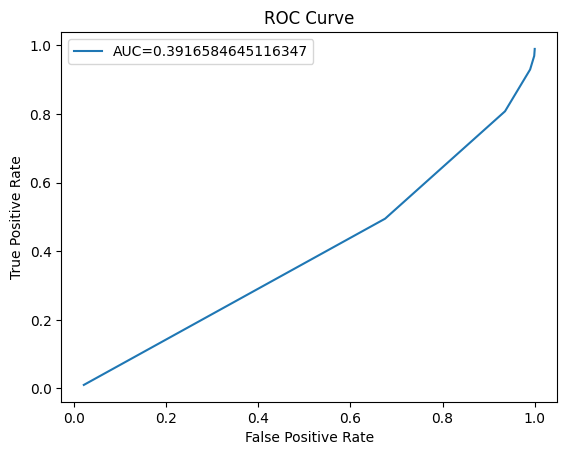

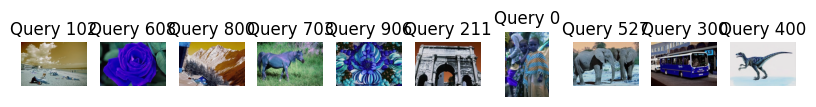

In [ ]:
import os
import cv2
import numpy as np
from scipy.stats import skew, kurtosis, mode
from sklearn.metrics import auc
import matplotlib.pyplot as plt


def calculate_distance_sift(descriptor1, descriptor2):
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptor1, descriptor2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    distance = len(good_matches) / max(len(descriptor1), len(descriptor2))
    return distance

def get_sift_descriptor(image_path):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return descriptors

def visualize_top_images(images_folder, queries_folder, distances, mx):
    plt.figure(figsize=(10, 10))
    k = 0
    for query in os.listdir(queries_folder):
        for image in os.listdir(images_folder):
            if k == 100:
                break
            quer = int(query.split('.')[0])
            img = int(image.split('.')[0])
            if distances[quer][img] == mx:
                plt.subplot(10, 10, k + 1)
                plt.imshow(cv2.imread(os.path.join(images_folder, image)))
                plt.title(f'Query {quer}')
                plt.axis('off')
                k += 1
    plt.show()


images = [None] * 1000

for image in os.listdir('Images'):
    image_idx = int(image.split('.')[0])
    images[image_idx] = get_sift_descriptor(os.path.join('Images', image))

distances = np.zeros((1000, 1000))

mx = 0
for query in os.listdir('Queries'):
    for image in os.listdir('Images'):
        quer = int(query.split('.')[0])
        img = int(image.split('.')[0])
        distances[quer][img] = calculate_distance_sift(images[quer], images[img])
        mx = max(mx, distances[quer][img])

true_pos = []
false_pos = []

for threshold in np.arange(0, mx, mx / 100):
    tp = 0
    fp = 0
    tn = 0
    fn = 0
    for query in os.listdir('Queries'):
        for image in os.listdir('Images'):
            quer = int(query.split('.')[0])
            img = int(image.split('.')[0])
            left_range_query = quer // 100 * 100
            right_range_query = left_range_query + 99
            if distances[quer][img] <= threshold and left_range_query <= img <= right_range_query:
                tp += 1
            elif distances[quer][img] <= threshold and (img > right_range_query or img < left_range_query):
                fp += 1
            elif distances[quer][img] > threshold and left_range_query <= img <= right_range_query:
                fn += 1
            else:
                tn += 1

    tp = tp // 10
    fp = fp // 10
    tn = tn // 10
    fn = fn // 10

    precise = tp / (tp + fp)
    recall = tp / (tp + fn)
    f1_score = (2 * precise * recall) / (precise + recall)
    fpr = fp / (fp + tn)
    tpr = tp / (tp + fn)
    true_pos.append(tpr)
    false_pos.append(fpr)

# Plot ROC curve
AUC = np.trapz(true_pos, false_pos)
plt.plot(false_pos, true_pos, label=f'AUC={AUC}')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Visualize top-retrieved images for a specific threshold
threshold_to_visualize = 0.5  # Adjust as needed
visualize_top_images('Images', 'Queries', distances, mx)

**Conclusion:**
In conclusion, a systematic analysis of various image representation methods was essential in developing the Content-Based Image Retrieval (CBIR) system. Initially, by utilizing color histograms, the system showcased enhancements through the modification of bin sizes, underscoring the method's sensitivity to this particular parameter.
The system performance was enhanced by incorporating color moments, including mean, skew, and standard deviation. Furthermore, by introducing weights and integrating kurtosis, median, and mode, the retrieval accuracy was further improved. This highlights the importance of these statistical moments in capturing subtle image characteristics.
The adoption of the VGG architecture marked a significant milestone in our progress. VGG surpassed traditional color-based techniques in extracting features by leveraging the power of deep learning. A crucial advancement was made with the incorporation of convolutional neural networks, showcasing the effectiveness of learned features in representing images.
To summarize, the advancement of CBIR from color histograms to intricate deep learning models such as VGG showcases the iterative nature of system development. Each enhancement builds upon the achievements of its predecessors, underscoring the importance of selecting appropriate imaging representations and models to achieve optimal retrieval performance. In essence, a methodical exploration of various image representation approaches was imperative in the development of the Content-Based Image Retrieval (CBIR) system. The system's progress was evident as adjustments were made to bin sizes, commencing with color histograms, highlighting the sensitivity of this parameter in the approach.